# Grid Helpers

In [1]:
import math
import random
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline


# Grid helper funcions:

def getGridFor(n_items, n_cols = 4, hspace = 0.2, wspace = 0.05):
    return getGrid(math.ceil(n_items / n_cols), n_cols, hspace, wspace)

def getGrid(n_rows, n_cols = 4, hspace = 0.2, wspace = 0.05):    
    plt.figure(random.randrange(0, 1000), figsize=(n_cols * 8, n_rows * 6))

    return gridspec.GridSpec(n_rows, n_cols, hspace, wspace)

# Camera Calibration Functions with OpenCV

In [23]:
import cv2
import glob
import numpy as np


def findChessboardCorners(glob_in, cols = 8, rows = 6, factor = 1, plot = True, dir_out = False):
    
    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((cols * rows, 3), np.float32)
    objp[:,:2] = np.mgrid[0:cols, 0:rows].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images
    obj_points = [] # 3d points in real world space
    img_points = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(glob_in)

    # Get a grid to plot the images
    gs  = getGridFor(len(images), 2)

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        img = cv2.resize(img, (0,0), fx = factor, fy = factor) 
        
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (cols, rows), None)

        # If found, add object points, image points
        if ret == True:
            obj_points.append(objp)
            img_points.append(corners)

            # Draw and display the corners
            if plot or dir_out:
                cv2.drawChessboardCorners(img, (cols, rows), corners, ret)
                name = 'corners_found_' + str(idx)
            
                if plot:
                    ax = plt.subplot(gs[int(idx / 2), idx % 2])
                    ax.imshow(img[:,:,::-1]) # BRG TO RGB
                    ax.set_title(name)
                    
                if dir_out:
                    cv2.imwrite(dir_out + name + '.jpg', img)
                    
    return obj_points, img_points

# Find Chessboard Corners in GoPro and OnePlus 5 Pictures

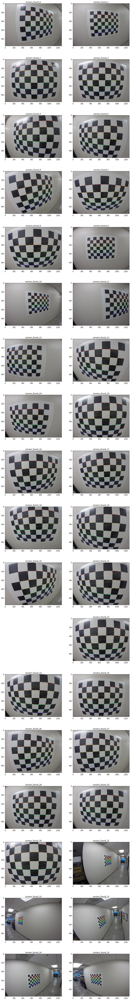

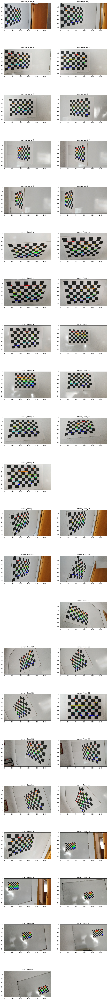

In [24]:
obj_points_gopro, img_points_gopro = findChessboardCorners('images/input/GoPro/*.jpg', dir_out='images/output/GoPro/')
obj_points_op5, img_points_op5 = findChessboardCorners('images/input/OnePlus 5/*.jpg', cols = 9, factor = 0.25, dir_out='images/output/OnePlus 5/')

# Load/Save Points From/To Pickle

In [18]:
import pickle

# Load/Save obj_points_gopro, img_points_gopro:

if obj_points_gopro is not None and img_points_gopro is not None and len(obj_points_gopro) > 0 and len(img_points_gopro) > 0:
    # SAVE:
    
    data = {}
    data['obj_points_gopro'] = obj_points_gopro
    data['img_points_gopro'] = img_points_gopro
    
    pickle.dump(data, open('data/gopro_points.p', 'wb'))
else:
    # LOAD:

    data = pickle.load(open('data/gopro_points.p', 'rb'))
    obj_points_gopro = data["obj_points_gopro"]
    img_points_gopro = data["img_points_gopro"]
    
# Load/Save obj_points_op5 and img_points_op5:

if obj_points_op5 is not None and img_points_op5 is not None and len(obj_points_op5) > 0 and len(img_points_op5) > 0:
    # SAVE:
    
    data = {}
    data['obj_points_op5'] = obj_points_op5
    data['img_points_op5'] = img_points_op5
    
    pickle.dump(data, open('data/op5_points.p', 'wb'))
else:
    # LOAD:

    data = pickle.load(open('data/op5_points.p', 'rb'))
    obj_points_op5 = data["obj_points_op5"]
    img_points_op5 = data["img_points_op5"]

# Calibrate Camera & Undistort Images

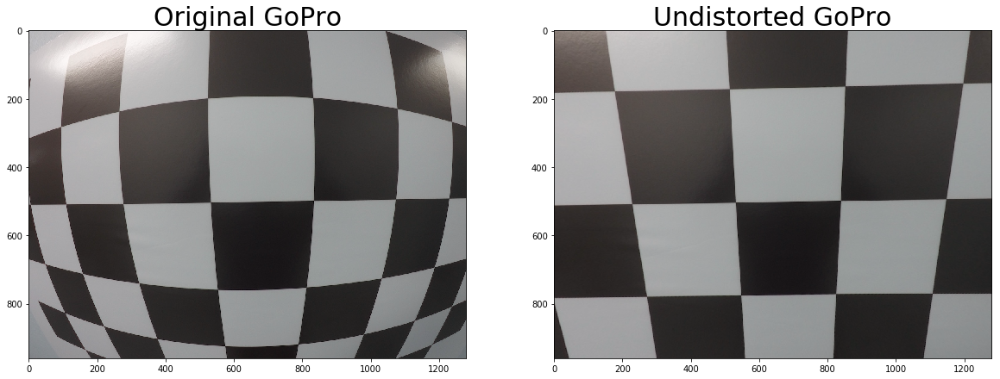

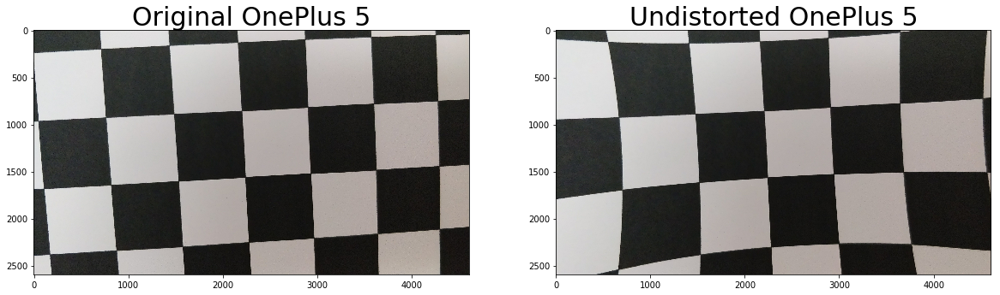

In [28]:
# Load one image for each data set:
img_gopro = cv2.imread('images/input/GoPro/GOPR0055.jpg')
img_op5 = cv2.imread('images/input/OnePlus 5/IMG_20171230_122903.jpg')

# BGR to RGB:
imggopro = img_gopro[:,:,::-1]
img_op5 = img_op5[:,:,::-1]

# Get their sizes:
size_gopro = (img_gopro.shape[1], img_gopro.shape[0])
size_op5 = (img_op5.shape[1], img_op5.shape[0])


# CAMERA CALIBRATION:

def calibrate_camera(obj_points, img_points, size, output):
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, size, None, None)

    # Save the camera calibration result for later use:
    data = {}
    data["mtx"] = mtx
    data["dist"] = dist
    data["rvecs"] = rvecs
    data["tvecs"] = tvecs
    
    pickle.dump(data, open(output, "wb"))
    
    return mtx, dist

# Calibrate both cameras:
mtx_gopro, dist_gopro = calibrate_camera(obj_points_gopro, img_points_gopro, size_gopro, 'data/gopro_calibration.p')
mtx_op5, dist_op5 = calibrate_camera(obj_points_op5, img_points_op5, size_op5, 'data/op5_calibration.p')


# UNDISTORT IMAGES:

undistort_gopro = cv2.undistort(img_gopro, mtx_gopro, dist_gopro, None, mtx_gopro)
undistort_op5 = cv2.undistort(img_op5, mtx_op5, dist_op5, None, mtx_op5)

# Visualize undistortion GoPro
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img_gopro)
ax1.set_title('Original GoPro', fontsize=30)
ax2.imshow(undistort_gopro)
ax2.set_title('Undistorted GoPro', fontsize=30)

# Visualize undistortion OnePlus 5
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img_op5)
ax1.set_title('Original OnePlus 5', fontsize=30)
ax2.imshow(undistort_op5)
ax2.set_title('Undistorted OnePlus 5', fontsize=30)

# Conclusion

Probably the folks at OnePlus have been smart enough to already apply undistortion algos to their camera, as we can deduce by looking at the original ones, where the lines found with `cv2.findChessboardCorners` are already quite straight. Therefore, re-undistorting a picture taken with the OnePlus 5 will actually distort it.